In [186]:
import sys
print(sys.version)

3.11.7 | packaged by Anaconda, Inc. | (main, Dec 15 2023, 18:05:47) [MSC v.1916 64 bit (AMD64)]


In [187]:
#conda install -c conda-forge ydata-profiling

In [188]:
#pip install datetime

In [189]:
#pip install --user pmdarima

In [190]:
#conda install libpython m2w64-toolchain -c msys2

In [191]:
#conda install -c conda-forge fbprophet

In [192]:
#pip install --user fbprophet

In [193]:
#pip install -U scikit-learn


In [194]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import datetime
from ydata_profiling import ProfileReport

#ARIMA
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt

from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn import linear_model

import pmdarima as pm
#from fbprophet import Prophet

from pandas import to_datetime
from pmdarima.model_selection import train_test_split
from numpy import *

from sklearn import datasets, linear_model
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import Normalizer

from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_validate
from sklearn import metrics
from sklearn.metrics import roc_auc_score
from scipy.stats import pearsonr

import random
from numpy import * 
from sklearn.metrics import roc_curve, auc

import itertools
import warnings




In [195]:
def load_demand_data():
    return pd.read_csv(Path("C:/Users/User/Documents/UNSW_Data Science 7446/ZZSC9020 Data Science Capstone Project/Data/Total Demand/totaldemand_nsw.csv"))

In [196]:
totalDemand = load_demand_data()


In [197]:
totalDemand.head()

,DATETIME,TOTALDEMAND,REGIONID
0,1/1/2010 0:00,8038.00,NSW1
1,1/1/2010 0:30,7809.31,NSW1
2,1/1/2010 1:00,7483.69,NSW1
3,1/1/2010 1:30,7117.23,NSW1
4,1/1/2010 2:00,6812.03,NSW1


In [198]:
totalDemand.describe()


,TOTALDEMAND
count,196513.000000
mean,8113.145859
std,1299.532774
min,5074.630000
25%,7150.070000
50%,8053.230000
75%,8958.550000
max,14579.860000


In [199]:
totalDemand.shape

(196513, 3)

In [200]:
def load_temperature_data():
    return pd.read_csv(Path("C:/Users/User/Documents/UNSW_Data Science 7446/ZZSC9020 Data Science Capstone Project/Data/Temperature/temperature_nsw.csv"))

In [201]:
temperature = load_temperature_data()

In [202]:
temperature.head()

,LOCATION,DATETIME,TEMPERATURE
0,Bankstown,1/1/2010 0:00,23.1
1,Bankstown,1/1/2010 0:01,23.1
2,Bankstown,1/1/2010 0:30,22.9
3,Bankstown,1/1/2010 0:50,22.7
4,Bankstown,1/1/2010 1:00,22.6


In [203]:
temperature.describe()


,TEMPERATURE
count,220326.000000
mean,17.418827
std,5.849763
min,-1.300000
25%,13.400000
50%,17.700000
75%,21.300000
max,44.700000


In [204]:
temperature.shape

(220326, 3)

In [205]:
dem_temp = pd.merge(temperature, totalDemand, on = 'DATETIME', how='outer')

In [206]:
dem_temp.head()

,LOCATION,DATETIME,TEMPERATURE,TOTALDEMAND,REGIONID
0,Bankstown,1/1/2010 0:00,23.1,8038.00,NSW1
1,Bankstown,1/1/2010 0:01,23.1,NaN,NaN
2,Bankstown,1/1/2010 0:30,22.9,7809.31,NSW1
3,Bankstown,1/1/2010 0:50,22.7,NaN,NaN
4,Bankstown,1/1/2010 1:00,22.6,7483.69,NSW1


In [207]:
dem_temp.describe()

,TEMPERATURE,TOTALDEMAND
count,220326.000000,196526.000000
mean,17.418827,8113.119994
std,5.849763,1299.510032
min,-1.300000,5074.630000
25%,13.400000,7150.060000
50%,17.700000,8053.215000
75%,21.300000,8958.550000
max,44.700000,14579.860000


In [208]:
dem_temp_inner = pd.merge(temperature, totalDemand, on = 'DATETIME')

In [209]:
dem_temp_inner.tail()

,LOCATION,DATETIME,TEMPERATURE,TOTALDEMAND,REGIONID
195942,Bankstown,17/3/2021 22:00,19.7,7419.77,NSW1
195943,Bankstown,17/3/2021 22:30,19.5,7417.91,NSW1
195944,Bankstown,17/3/2021 23:00,19.1,7287.32,NSW1
195945,Bankstown,17/3/2021 23:30,18.8,7172.39,NSW1
195946,Bankstown,18/3/2021 0:00,18.6,7094.51,NSW1


In [210]:
dem_temp_inner.describe()

,TEMPERATURE,TOTALDEMAND
count,195947.000000,195947.000000
mean,17.530995,8111.924589
std,5.884212,1299.171401
min,-1.300000,5074.630000
25%,13.500000,7149.430000
50%,17.900000,8052.180000
75%,21.500000,8956.985000
max,44.700000,14579.860000


In [211]:
dem_temp_inner.head()

,LOCATION,DATETIME,TEMPERATURE,TOTALDEMAND,REGIONID
0,Bankstown,1/1/2010 0:00,23.1,8038.00,NSW1
1,Bankstown,1/1/2010 0:30,22.9,7809.31,NSW1
2,Bankstown,1/1/2010 1:00,22.6,7483.69,NSW1
3,Bankstown,1/1/2010 1:30,22.5,7117.23,NSW1
4,Bankstown,1/1/2010 2:00,22.5,6812.03,NSW1


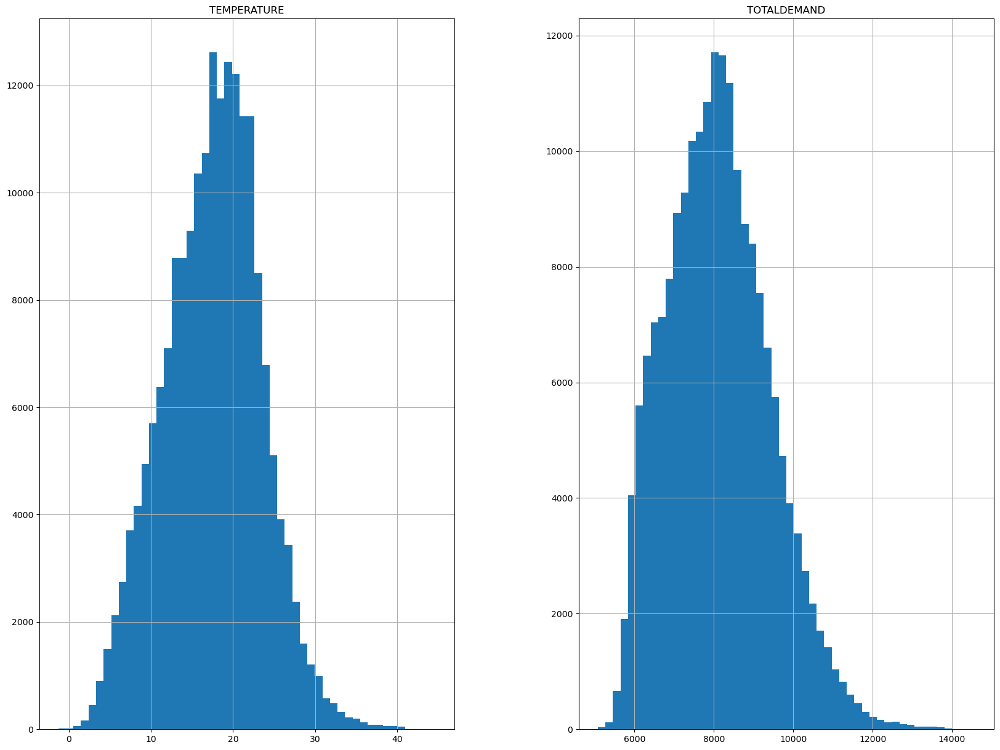

In [212]:
dem_temp_inner.hist(bins=50, figsize=(20, 15))
plt.show()


C:\Users\User\AppData\Local\Temp\ipykernel_26804\86196659.py:2: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=dem_temp_inner, x="TEMPERATURE", y="TOTALDEMAND",  palette="pastel")


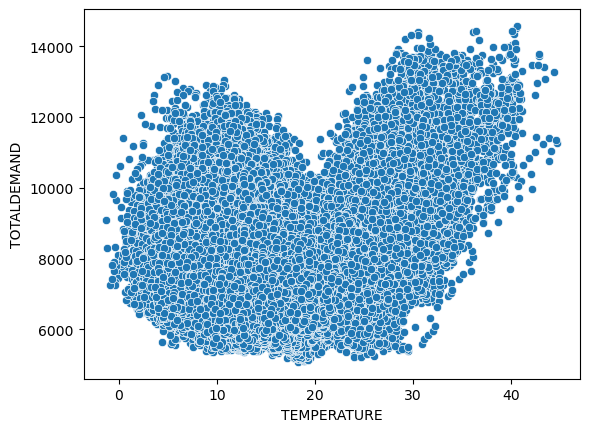

In [213]:
#sns.color_palette("Set2")
sns.scatterplot(data=dem_temp_inner, x="TEMPERATURE", y="TOTALDEMAND",  palette="pastel")
#sns.color_palette("Set2")
plt.show()

In [214]:
dem_temp_inner.dtypes

LOCATION        object
DATETIME        object
TEMPERATURE    float64
TOTALDEMAND    float64
REGIONID        object
dtype: object

In [215]:
def load_forecast_data():
    return pd.read_csv(Path("C:/Users/User/Documents/UNSW_Data Science 7446/ZZSC9020 Data Science Capstone Project/Data/Forecast Demand/forecastdemand_sa.csv"))

In [216]:
forecastDemand = load_forecast_data()

In [217]:
forecastDemand.shape

(4095592, 6)

In [218]:
forecastDemand.head()

,PREDISPATCHSEQNO,REGIONID,PERIODID,FORECASTDEMAND,LASTCHANGED,DATETIME
0,2016123018,SA1,71,1394.41,2016-12-30 12:31:25,2017-01-01 00:00:00
1,2016123018,SA1,72,1285.07,2016-12-30 12:31:25,2017-01-01 00:30:00
2,2016123018,SA1,73,1221.70,2016-12-30 12:31:25,2017-01-01 01:00:00
3,2016123018,SA1,74,1141.86,2016-12-30 12:31:25,2017-01-01 01:30:00
4,2016123018,SA1,75,1087.78,2016-12-30 12:31:25,2017-01-01 02:00:00


In [219]:
forecastDemand = forecastDemand[forecastDemand['REGIONID'] == 'SA1']

In [220]:
forecastDemand.shape

(4095592, 6)

In [221]:
forecastDemand.head()

,PREDISPATCHSEQNO,REGIONID,PERIODID,FORECASTDEMAND,LASTCHANGED,DATETIME
0,2016123018,SA1,71,1394.41,2016-12-30 12:31:25,2017-01-01 00:00:00
1,2016123018,SA1,72,1285.07,2016-12-30 12:31:25,2017-01-01 00:30:00
2,2016123018,SA1,73,1221.70,2016-12-30 12:31:25,2017-01-01 01:00:00
3,2016123018,SA1,74,1141.86,2016-12-30 12:31:25,2017-01-01 01:30:00
4,2016123018,SA1,75,1087.78,2016-12-30 12:31:25,2017-01-01 02:00:00


In [222]:
forecastDemand['REGIONID'] == 'SA1'

0          True
1          True
2          True
3          True
4          True
           ... 
4095587    True
4095588    True
4095589    True
4095590    True
4095591    True
Name: REGIONID, Length: 4095592, dtype: bool

In [223]:
forecastDemand.dtypes

PREDISPATCHSEQNO      int64
REGIONID             object
PERIODID              int64
FORECASTDEMAND      float64
LASTCHANGED          object
DATETIME             object
dtype: object

In [224]:
forecastDemand['REGIONID'] == 'NSW1'

0          False
1          False
2          False
3          False
4          False
           ...  
4095587    False
4095588    False
4095589    False
4095590    False
4095591    False
Name: REGIONID, Length: 4095592, dtype: bool

In [225]:
dem_temp_inner['DATETIME']

0           1/1/2010 0:00
1           1/1/2010 0:30
2           1/1/2010 1:00
3           1/1/2010 1:30
4           1/1/2010 2:00
               ...       
195942    17/3/2021 22:00
195943    17/3/2021 22:30
195944    17/3/2021 23:00
195945    17/3/2021 23:30
195946     18/3/2021 0:00
Name: DATETIME, Length: 195947, dtype: object

In [226]:
pd.to_datetime(dem_temp_inner['DATETIME'], format='mixed')

0        2010-01-01 00:00:00
1        2010-01-01 00:30:00
2        2010-01-01 01:00:00
3        2010-01-01 01:30:00
4        2010-01-01 02:00:00
                 ...        
195942   2021-03-17 22:00:00
195943   2021-03-17 22:30:00
195944   2021-03-17 23:00:00
195945   2021-03-17 23:30:00
195946   2021-03-18 00:00:00
Name: DATETIME, Length: 195947, dtype: datetime64[ns]

In [227]:
dem_temp_inner['DATETIME'] = pd.to_datetime(dem_temp_inner['DATETIME'], format='mixed')

In [228]:
dem_temp_inner.dtypes


LOCATION               object
DATETIME       datetime64[ns]
TEMPERATURE           float64
TOTALDEMAND           float64
REGIONID               object
dtype: object

In [229]:
dem_temp_inner['day'] = dem_temp_inner['DATETIME'].dt.day
dem_temp_inner['month'] = dem_temp_inner['DATETIME'].dt.month
dem_temp_inner['year'] = dem_temp_inner['DATETIME'].dt.year
dem_temp_inner['hour'] = dem_temp_inner['DATETIME'].dt.hour
dem_temp_inner['date'] = dem_temp_inner['DATETIME'].dt.date
dem_temp_inner['weekday'] = dem_temp_inner['DATETIME'].dt.weekday
dem_temp_inner['month'] = dem_temp_inner['DATETIME'].dt.month
dem_temp_inner['day_name'] = dem_temp_inner['DATETIME'].dt.day_name()
#dem_temp_inner['date + hour'] = str(dem_temp_inner['DATETIME'].dt.date) + str(dem_temp_inner['DATETIME'].dt.hour)

In [230]:
dem_temp_inner.head()

,LOCATION,DATETIME,TEMPERATURE,TOTALDEMAND,REGIONID,day,month,year,hour,date,weekday,day_name
0,Bankstown,2010-01-01 00:00:00,23.1,8038.00,NSW1,1,1,2010,0,2010-01-01,4,Friday
1,Bankstown,2010-01-01 00:30:00,22.9,7809.31,NSW1,1,1,2010,0,2010-01-01,4,Friday
2,Bankstown,2010-01-01 01:00:00,22.6,7483.69,NSW1,1,1,2010,1,2010-01-01,4,Friday
3,Bankstown,2010-01-01 01:30:00,22.5,7117.23,NSW1,1,1,2010,1,2010-01-01,4,Friday
4,Bankstown,2010-01-01 02:00:00,22.5,6812.03,NSW1,1,1,2010,2,2010-01-01,4,Friday


In [231]:
grouped_hour = dem_temp_inner.groupby('hour')

In [232]:
grouped_hour.head()

,LOCATION,DATETIME,TEMPERATURE,TOTALDEMAND,REGIONID,day,month,year,hour,date,weekday,day_name
0,Bankstown,2010-01-01 00:00:00,23.1,8038.00,NSW1,1,1,2010,0,2010-01-01,4,Friday
1,Bankstown,2010-01-01 00:30:00,22.9,7809.31,NSW1,1,1,2010,0,2010-01-01,4,Friday
2,Bankstown,2010-01-01 01:00:00,22.6,7483.69,NSW1,1,1,2010,1,2010-01-01,4,Friday
3,Bankstown,2010-01-01 01:30:00,22.5,7117.23,NSW1,1,1,2010,1,2010-01-01,4,Friday
4,Bankstown,2010-01-01 02:00:00,22.5,6812.03,NSW1,1,1,2010,2,2010-01-01,4,Friday
...,...,...,...,...,...,...,...,...,...,...,...,...
134,Bankstown,2010-03-01 19:00:00,19.7,7878.88,NSW1,1,3,2010,19,2010-03-01,0,Monday
136,Bankstown,2010-03-01 20:00:00,19.5,7995.93,NSW1,1,3,2010,20,2010-03-01,0,Monday
138,Bankstown,2010-03-01 21:00:00,19.0,7642.16,NSW1,1,3,2010,21,2010-03-01,0,Monday
140,Bankstown,2010-03-01 22:00:00,19.2,7528.43,NSW1,1,3,2010,22,2010-03-01,0,Monday


In [233]:
dem_temp_inner.groupby([dem_temp_inner["DATETIME"].dt.date])[["TEMPERATURE", "TOTALDEMAND"]].mean()


,TEMPERATURE,TOTALDEMAND
DATETIME,,
2010-01-01,25.185417,7801.352917
2010-01-02,24.461702,9557.546383
2010-01-03,18.737500,8560.798958
2010-01-04,19.191489,8499.952553
2010-01-05,15.912821,8025.070256
...,...,...
2021-11-02,21.970833,7562.555417
2021-11-03,22.175000,7841.899792
2021-12-01,23.850000,8058.727083


<Axes: xlabel='DATETIME'>

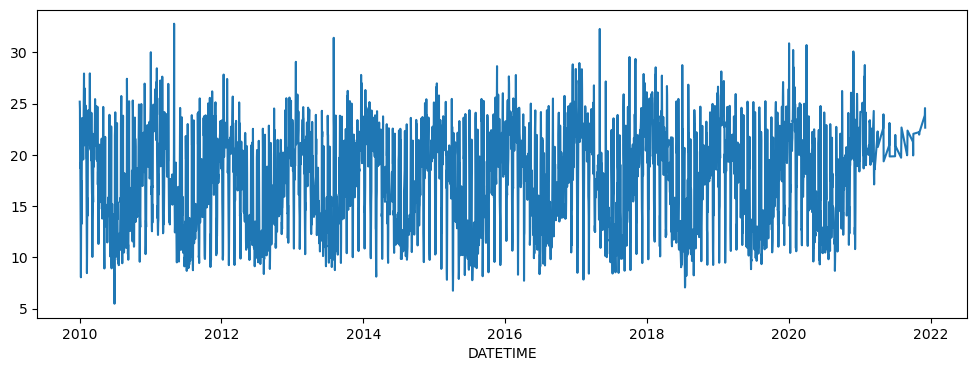

In [234]:
fig, axs = plt.subplots(figsize=(12, 4))

dem_temp_inner.groupby([dem_temp_inner["DATETIME"].dt.date])["TEMPERATURE"].mean().plot(
    kind='line', rot=0, ax=axs
)

<Axes: xlabel='DATETIME'>

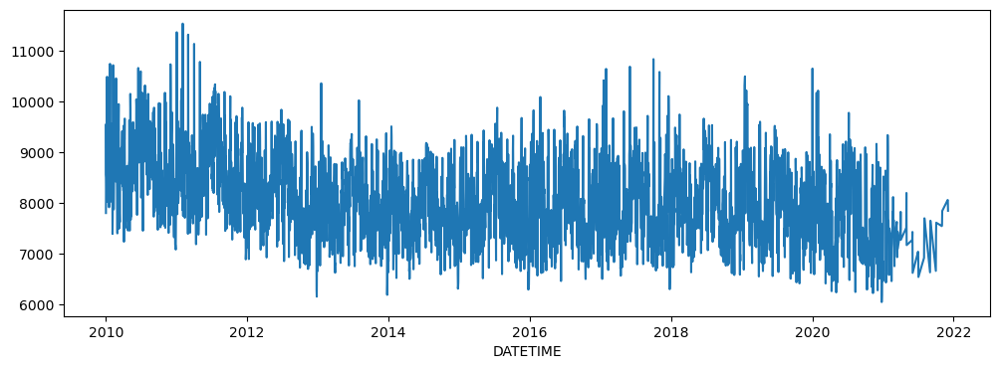

In [235]:
fig, axs = plt.subplots(figsize=(12, 4))

dem_temp_inner.groupby([dem_temp_inner["DATETIME"].dt.date])["TOTALDEMAND"].mean().plot(
    kind='line', rot=0, ax=axs
)

<Axes: xlabel='DATETIME'>

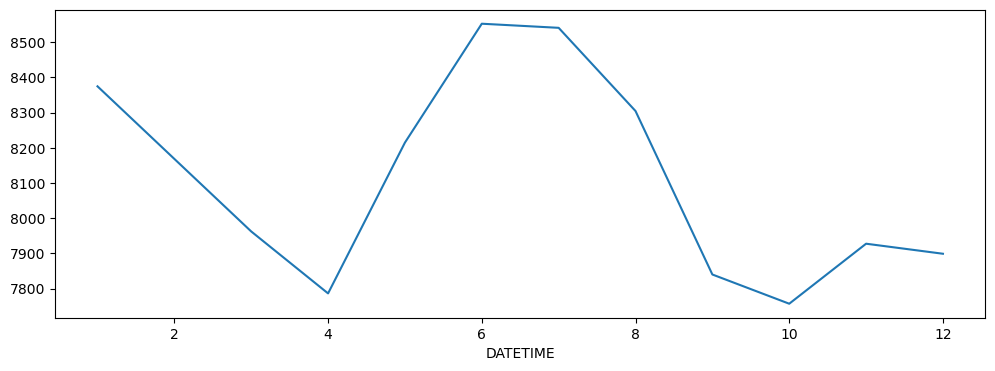

In [236]:
fig, axs = plt.subplots(figsize=(12, 4))

dem_temp_inner.groupby([dem_temp_inner["DATETIME"].dt.month])["TOTALDEMAND"].mean().plot(
    kind='line', rot=0, ax=axs
)

<Axes: xlabel='DATETIME'>

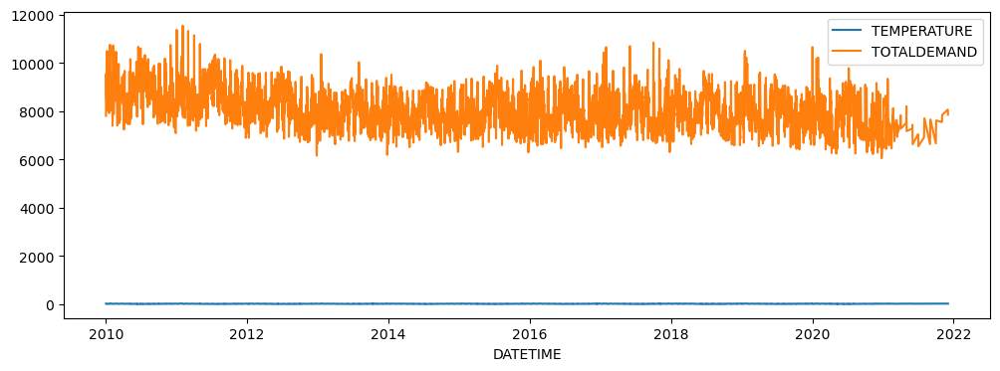

In [237]:
fig, axs = plt.subplots(figsize=(12, 4))

dem_temp_inner.groupby([dem_temp_inner["DATETIME"].dt.date])[["TEMPERATURE", "TOTALDEMAND"]].mean().plot(
    kind='line', rot=0, ax=axs
)

<Axes: xlabel='DATETIME'>

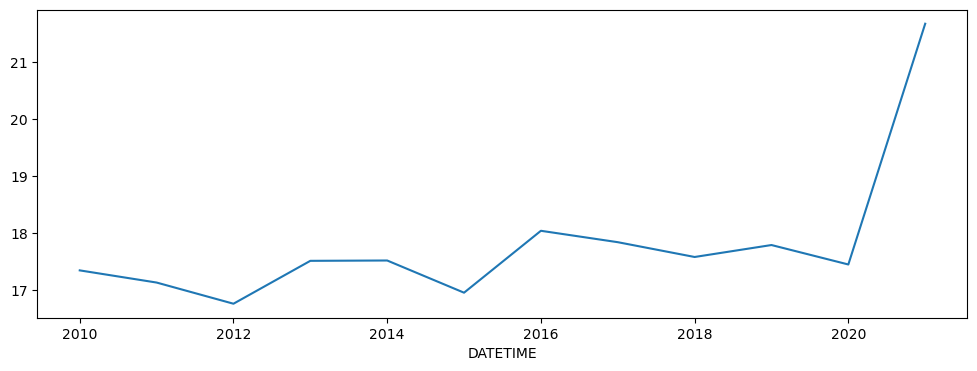

In [238]:
fig, axs = plt.subplots(figsize=(12, 4))

dem_temp_inner.groupby([dem_temp_inner["DATETIME"].dt.year])["TEMPERATURE"].mean().plot(
    kind='line', rot=0, ax=axs
)

<Axes: xlabel='DATETIME'>

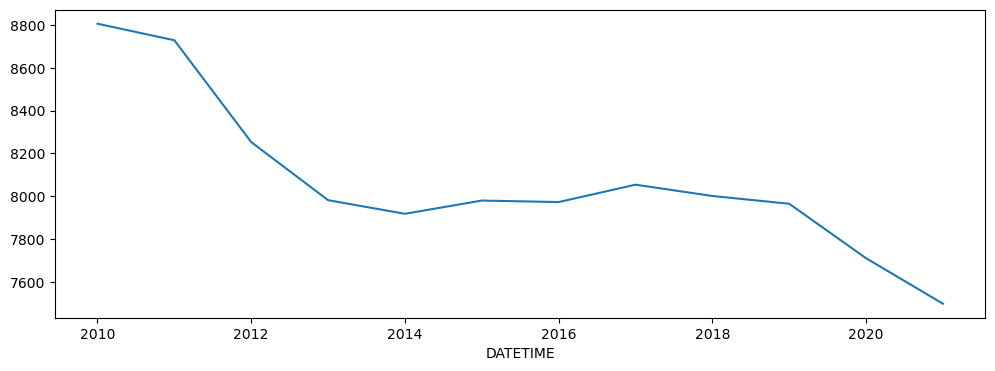

In [239]:
fig, axs = plt.subplots(figsize=(12, 4))

dem_temp_inner.groupby([dem_temp_inner["DATETIME"].dt.year])["TOTALDEMAND"].mean().plot(
    kind='line', rot=0, ax=axs
)

<Axes: xlabel='DATETIME'>

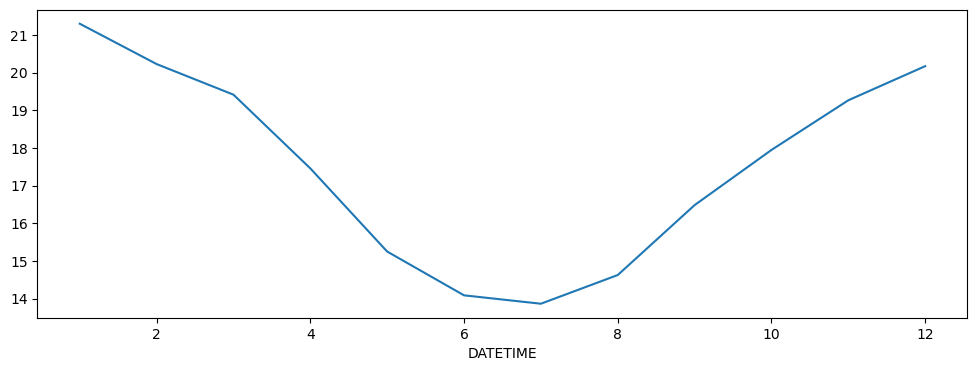

In [240]:
fig, axs = plt.subplots(figsize=(12, 4))

dem_temp_inner.groupby([dem_temp_inner["DATETIME"].dt.month])["TEMPERATURE"].mean().plot(
    kind='line', rot=0, ax=axs
)

<Axes: xlabel='DATETIME'>

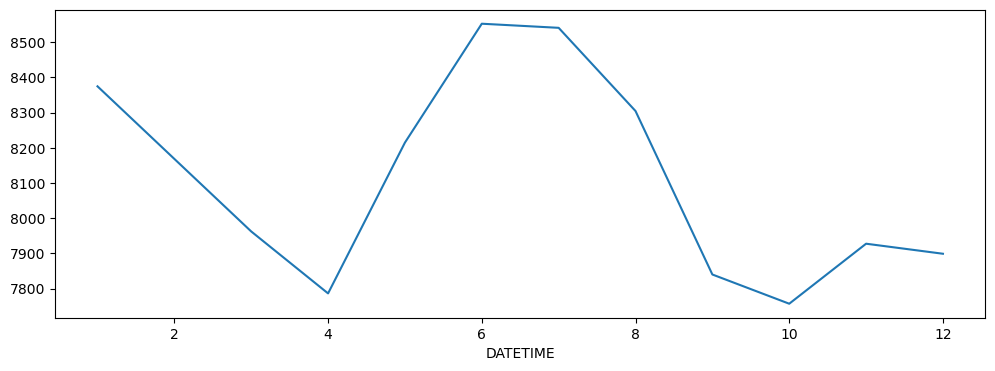

In [241]:
fig, axs = plt.subplots(figsize=(12, 4))

dem_temp_inner.groupby([dem_temp_inner["DATETIME"].dt.month])["TOTALDEMAND"].mean().plot(
    kind='line', rot=0, ax=axs
)

In [242]:
dem_temp_inner.groupby([dem_temp_inner["DATETIME"].dt.year])[["TEMPERATURE", "TOTALDEMAND"]].mean()

,TEMPERATURE,TOTALDEMAND
DATETIME,,
2010,17.350959,8806.634881
2011,17.137916,8729.258601
2012,16.767150,8253.115030
2013,17.518075,7981.460353
2014,17.524010,7917.697750
2015,16.960325,7979.624178
2016,18.044215,7972.542419
2017,17.844709,8053.839384
2018,17.585447,8001.012442


In [243]:
dem_temp_inner.groupby([dem_temp_inner["DATETIME"].dt.year])[["TEMPERATURE", "TOTALDEMAND"]].median()

,TEMPERATURE,TOTALDEMAND
DATETIME,,
2010,17.4,8924.210
2011,17.1,8810.075
2012,17.3,8317.960
2013,17.7,8044.295
2014,18.1,7984.690
2015,17.3,7990.315
2016,18.3,7933.990
2017,18.3,7960.675
2018,18.0,7947.570


In [244]:
dem_temp_inner.groupby([dem_temp_inner["DATETIME"].dt.year])[["TEMPERATURE", "TOTALDEMAND"]].count()

,TEMPERATURE,TOTALDEMAND
DATETIME,,
2010,17259,17259
2011,17502,17502
2012,17534,17534
2013,17516,17516
2014,17518,17518
2015,17520,17520
2016,17347,17347
2017,17520,17520
2018,17495,17495


In [245]:
dem_temp_inner.groupby([dem_temp_inner["DATETIME"].dt.month])[["TEMPERATURE", "TOTALDEMAND"]].count()

,TEMPERATURE,TOTALDEMAND
DATETIME,,
1,17410,17410
2,15810,15810
3,16707,16707
4,15940,15940
5,16457,16457
6,15939,15939
7,16305,16305
8,16492,16492
9,15974,15974


In [246]:
dem_temp_inner.groupby([dem_temp_inner["DATETIME"].dt.day])[["TEMPERATURE", "TOTALDEMAND"]].count()

,TEMPERATURE,TOTALDEMAND
DATETIME,,
1,6915,6915
2,6903,6903
3,6863,6863
4,6324,6324
5,6297,6297
6,6335,6335
7,6326,6326
8,6325,6325
9,6324,6324


In [247]:
dem_temp_inner.groupby([dem_temp_inner["DATETIME"].dt.day_name()])[["TEMPERATURE", "TOTALDEMAND"]].count()

,TEMPERATURE,TOTALDEMAND
DATETIME,,
Friday,28017,28017
Monday,27900,27900
Saturday,28025,28025
Sunday,28007,28007
Thursday,27959,27959
Tuesday,27955,27955
Wednesday,28084,28084


In [248]:
dem_temp_inner.groupby([dem_temp_inner["DATETIME"].dt.day_name()])[["TEMPERATURE", "TOTALDEMAND"]].mean()

,TEMPERATURE,TOTALDEMAND
DATETIME,,
Friday,17.560042,8210.423389
Monday,17.361957,8214.550773
Saturday,17.507001,7843.580903
Sunday,17.602646,7753.571994
Thursday,17.660052,8283.164466
Tuesday,17.436580,8239.441757
Wednesday,17.587933,8239.447850


<Axes: xlabel='DATETIME'>

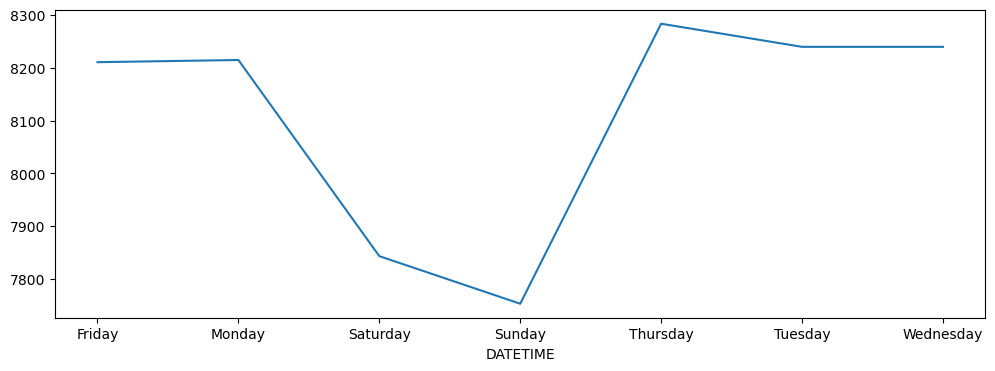

In [249]:
fig, axs = plt.subplots(figsize=(12, 4))

dem_temp_inner.groupby([dem_temp_inner["DATETIME"].dt.day_name()])["TOTALDEMAND"].mean().plot(
    kind='line', rot=0, ax=axs
)

<Axes: xlabel='DATETIME'>

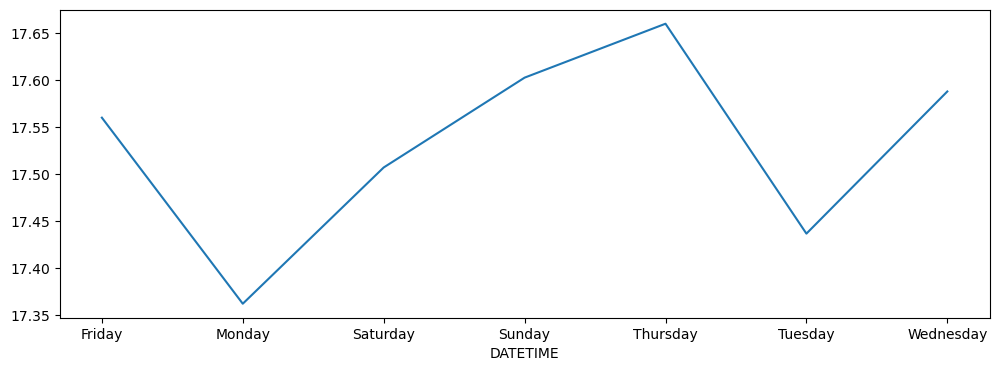

In [250]:
fig, axs = plt.subplots(figsize=(12, 4))

dem_temp_inner.groupby([dem_temp_inner["DATETIME"].dt.day_name()])["TEMPERATURE"].mean().plot(
    kind='line', rot=0, ax=axs
)

In [251]:
dem_temp_inner.groupby(['year', 'month'])[["TEMPERATURE", "TOTALDEMAND"]].mean()

TEMPERATURE  TOTALDEMAND
year month                          
2010 1        20.868008  8941.450389
     2        20.218907  8855.467677
     3        19.828286  8698.725127
     4        17.593856  8452.863411
     5        15.323485  8897.770510
...                 ...          ...
2021 8        21.104167  7368.353056
     9        20.999306  7229.393819
     10       21.084722  7209.823194
     11       22.118056  7649.492569
     12       23.685417  7986.625903

[144 rows x 2 columns]

<Axes: xlabel='year,month'>

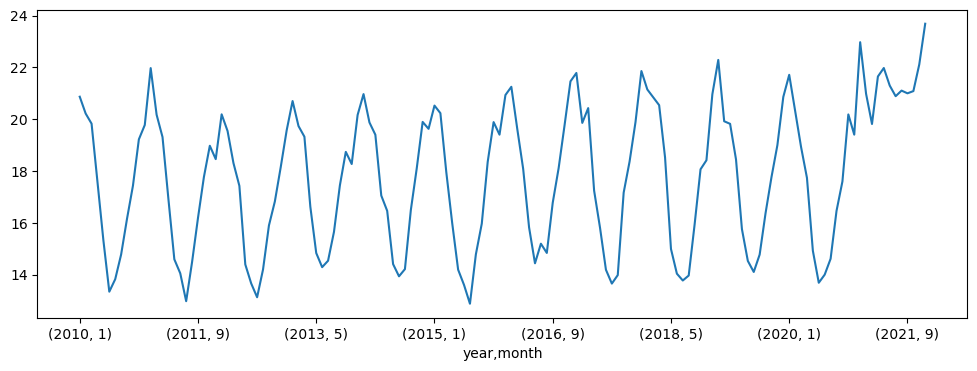

In [252]:
fig, axs = plt.subplots(figsize=(12, 4))

dem_temp_inner.groupby(['year', 'month'])["TEMPERATURE"].mean().plot(
    kind='line', rot=0, ax=axs
)

In [253]:
dem_temp_inner.groupby(['year', 'month'])[["TEMPERATURE", "TOTALDEMAND"]].count()

TEMPERATURE  TOTALDEMAND
year month                          
2010 1             1466         1466
     2             1317         1317
     3             1453         1453
     4             1416         1416
     5             1452         1452
...                 ...          ...
2021 8              144          144
     9              144          144
     10             144          144
     11             144          144
     12             144          144

[144 rows x 2 columns]

In [254]:
profile = ProfileReport(dem_temp_inner, title="Pandas Profiling Report")

In [255]:
#pip install ipywidgets==7.7 jupyterlab

In [256]:
#profile

In [257]:
dem_temp_inner.groupby(['year','month'])[["TEMPERATURE", "TOTALDEMAND"]].mean()

TEMPERATURE  TOTALDEMAND
year month                          
2010 1        20.868008  8941.450389
     2        20.218907  8855.467677
     3        19.828286  8698.725127
     4        17.593856  8452.863411
     5        15.323485  8897.770510
...                 ...          ...
2021 8        21.104167  7368.353056
     9        20.999306  7229.393819
     10       21.084722  7209.823194
     11       22.118056  7649.492569
     12       23.685417  7986.625903

[144 rows x 2 columns]

In [258]:
dem_temp_inner.groupby(['year','month'])["TEMPERATURE"].min()

year  month
2010  1         1.6
      2         3.2
      3         6.3
      4         6.5
      5         3.1
               ... 
2021  8        16.9
      9        14.2
      10       14.8
      11       15.7
      12       16.1
Name: TEMPERATURE, Length: 144, dtype: float64

In [259]:
dem_temp_inner.groupby(['year','month'])["TEMPERATURE"].max()

year  month
2010  1        41.1
      2        35.4
      3        34.7
      4        29.9
      5        28.4
               ... 
2021  8        30.7
      9        27.5
      10       26.9
      11       27.3
      12       33.5
Name: TEMPERATURE, Length: 144, dtype: float64

In [260]:
temp_dem =dem_temp_inner.groupby(['year', 'month'])[["TEMPERATURE", "TOTALDEMAND"]].mean()

In [261]:
temp_dem.to_csv('C:/Users/User/Documents/UNSW_Data Science 7446/ZZSC9020 Data Science Capstone Project/Data/temp_dem.csv', index=False)

In [262]:
def demand_data():
    return pd.read_csv(Path("C:/Users/User/Documents/UNSW_Data Science 7446/ZZSC9020 Data Science Capstone Project/Data/model_data.csv"))

In [263]:
demand = demand_data()

In [264]:
demand.head()

,Unnamed: 0,Year,Month,temp_mean,temp_min,temp_max,demand_mean,demand_sum,demand_max,demand_mean_max,Cumulative,Population,GSP
0,0,2010,1,20.868008,1.6,41.1,8941.450389,13108166.27,13765.04,10613.530000,28278.392,7110454,44504.25
1,1,2010,2,20.218907,3.2,35.4,8855.467677,11662650.93,13377.27,10380.667857,32153.986,7119405,44504.25
2,2,2010,3,19.828286,6.3,34.7,8698.725127,12639247.61,11991.47,10132.978710,38195.588,7128356,44504.25
3,3,2010,4,17.593856,6.5,29.9,8452.863411,11969254.59,11436.13,9804.072333,45142.723,7133668,44504.25
4,4,2010,5,15.323485,3.1,28.4,8897.770510,12919562.78,12386.49,10558.023548,54370.332,7138980,44504.25


In [265]:
profile2 = ProfileReport(demand, title="Pandas Profiling Report")

In [266]:
profile2

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [267]:
demand.describe()

,Unnamed: 0,Year,Month,temp_mean,temp_min,temp_max,demand_mean,demand_sum,demand_max,demand_mean_max,Cumulative,Population,GSP
count,144.000000,144.000000,144.000000,144.000000,144.000000,144.000000,144.000000,1.440000e+02,144.000000,144.000000,1.440000e+02,1.440000e+02,144.000000
mean,71.500000,2015.500000,6.500000,17.802954,4.429167,33.328472,8065.144734,1.103825e+07,11782.369653,9563.819700,1.330761e+06,7.670005e+06,51148.471065
std,41.713307,3.464102,3.464102,2.744427,3.568057,4.163354,485.758111,2.826700e+06,1103.363080,640.678043,1.091433e+06,3.358306e+05,4205.163130
min,0.000000,2010.000000,1.000000,12.878427,-1.300000,25.100000,6845.285833,9.857212e+05,8210.460000,7993.900000,2.827839e+04,7.110454e+06,44504.250000
25%,35.750000,2012.750000,3.750000,14.975254,2.400000,30.200000,7730.923522,1.107312e+07,11276.767500,9120.988417,5.259538e+05,7.360630e+06,47240.166667
50%,71.500000,2015.500000,6.500000,18.107905,3.650000,32.650000,8041.223336,1.168722e+07,11717.365000,9575.574678,1.005092e+06,7.677402e+06,50777.750000
75%,107.250000,2018.250000,9.250000,19.981671,4.925000,35.625000,8375.877240,1.225278e+07,12306.725000,10005.277393,1.862012e+06,8.006016e+06,55235.750000
max,143.000000,2021.000000,12.000000,23.685417,17.600000,44.700000,9313.327392,1.385823e+07,14579.860000,11166.055667,4.291460e+06,8.112001e+06,57391.083333


In [268]:
demand_excl_2021 = demand.drop(demand[demand['Year'] == 2021].index)

In [269]:
demand_excl_2021.describe()

,Unnamed: 0,Year,Month,temp_mean,temp_min,temp_max,demand_mean,demand_sum,demand_max,demand_mean_max,Cumulative,Population,GSP
count,132.000000,132.000000,132.000000,132.000000,132.000000,132.000000,132.000000,1.320000e+02,132.000000,132.000000,1.320000e+02,1.320000e+02,132.000000
mean,65.500000,2015.000000,6.500000,17.462527,3.489394,33.696212,8124.400449,1.183447e+07,11978.703485,9632.901257,1.101513e+06,7.631426e+06,50629.499369
std,38.249183,3.174324,3.465203,2.594532,1.716078,4.021363,454.106576,7.262989e+05,878.422074,600.233373,8.113469e+05,3.242163e+05,4001.254789
min,0.000000,2010.000000,1.000000,12.878427,-1.300000,26.800000,7276.301326,1.047787e+07,10456.640000,8584.270968,2.827839e+04,7.110454e+06,44504.250000
25%,32.750000,2012.000000,3.750000,14.821539,2.275000,30.650000,7790.556196,1.121840e+07,11341.342500,9131.710065,4.829117e+05,7.334008e+06,47240.166667
50%,65.500000,2015.000000,6.500000,17.750278,3.450000,32.800000,8068.671193,1.181199e+07,11794.085000,9650.136452,9.218320e+05,7.621027e+06,50777.750000
75%,98.250000,2018.000000,9.250000,19.787499,4.600000,35.775000,8404.121328,1.229899e+07,12372.562500,10036.749382,1.518034e+06,7.936337e+06,54017.166667
max,131.000000,2020.000000,12.000000,22.287844,8.800000,44.700000,9313.327392,1.385823e+07,14579.860000,11166.055667,3.340420e+06,8.112001e+06,56682.416667


In [270]:
demand_excl_2021.dtypes


Unnamed: 0           int64
Year                 int64
Month                int64
temp_mean          float64
temp_min           float64
temp_max           float64
demand_mean        float64
demand_sum         float64
demand_max         float64
demand_mean_max    float64
Cumulative         float64
Population           int64
GSP                float64
dtype: object

In [271]:
#demand_excl_2021['Year'] = (demand_excl_2021['Year']).astype(object)

In [272]:
#demand_excl_2021['Month'] = (demand_excl_2021['Month']).astype(object)

In [273]:
demand_excl_2021.dtypes

Unnamed: 0           int64
Year                 int64
Month                int64
temp_mean          float64
temp_min           float64
temp_max           float64
demand_mean        float64
demand_sum         float64
demand_max         float64
demand_mean_max    float64
Cumulative         float64
Population           int64
GSP                float64
dtype: object

In [274]:
demand_excl_2021['datetime'] = demand_excl_2021['Month'].astype(str) + "-" + demand_excl_2021['Year'].astype(str)

In [275]:
demand_excl_2021.head()

,Unnamed: 0,Year,Month,temp_mean,temp_min,temp_max,demand_mean,demand_sum,demand_max,demand_mean_max,Cumulative,Population,GSP,datetime
0,0,2010,1,20.868008,1.6,41.1,8941.450389,13108166.27,13765.04,10613.530000,28278.392,7110454,44504.25,1-2010
1,1,2010,2,20.218907,3.2,35.4,8855.467677,11662650.93,13377.27,10380.667857,32153.986,7119405,44504.25,2-2010
2,2,2010,3,19.828286,6.3,34.7,8698.725127,12639247.61,11991.47,10132.978710,38195.588,7128356,44504.25,3-2010
3,3,2010,4,17.593856,6.5,29.9,8452.863411,11969254.59,11436.13,9804.072333,45142.723,7133668,44504.25,4-2010
4,4,2010,5,15.323485,3.1,28.4,8897.770510,12919562.78,12386.49,10558.023548,54370.332,7138980,44504.25,5-2010


In [276]:
demand_excl_2021.dtypes

Unnamed: 0           int64
Year                 int64
Month                int64
temp_mean          float64
temp_min           float64
temp_max           float64
demand_mean        float64
demand_sum         float64
demand_max         float64
demand_mean_max    float64
Cumulative         float64
Population           int64
GSP                float64
datetime            object
dtype: object

In [277]:
demand_excl_2021['datetime'] = pd.to_datetime(demand_excl_2021['datetime'], format='mixed')

In [278]:
demand_excl_2021.dtypes

Unnamed: 0                  int64
Year                        int64
Month                       int64
temp_mean                 float64
temp_min                  float64
temp_max                  float64
demand_mean               float64
demand_sum                float64
demand_max                float64
demand_mean_max           float64
Cumulative                float64
Population                  int64
GSP                       float64
datetime           datetime64[ns]
dtype: object

# Time Series - Model (ARIMA) for mean demand

In [279]:
demand_excl_2021.isnull().sum()

Unnamed: 0         0
Year               0
Month              0
temp_mean          0
temp_min           0
temp_max           0
demand_mean        0
demand_sum         0
demand_max         0
demand_mean_max    0
Cumulative         0
Population         0
GSP                0
datetime           0
dtype: int64

In [280]:
demand_time = demand_excl_2021[['demand_mean', 'datetime']]
demand_time.head()

,demand_mean,datetime
0,8941.450389,2010-01-01
1,8855.467677,2010-02-01
2,8698.725127,2010-03-01
3,8452.863411,2010-04-01
4,8897.770510,2010-05-01


## Dataframe for Peak Demand

In [281]:
demand_max = demand_excl_2021[['demand_max', 'datetime']]
demand_max.head()

,demand_max,datetime
0,13765.04,2010-01-01
1,13377.27,2010-02-01
2,11991.47,2010-03-01
3,11436.13,2010-04-01
4,12386.49,2010-05-01


## Running ARIMA (Autoregressive Integrated Moving Average) for NSW for Mean Demand and Peak Demand

In [282]:
NSW = demand_time[demand_time['datetime']<'2020-01-01']
NSW_V = demand_time[demand_time['datetime']>='2020-01-01']

NSW_peak = demand_max[demand_max['datetime']<'2020-01-01']
NSW_V_peak = demand_max[demand_max['datetime']>='2020-01-01']

X_train = demand_time[demand_time['datetime']<'2020-01-01']
X_valid = demand_time[demand_time['datetime']>='2020-01-01']

Xpeak_train = demand_max[demand_max['datetime']<'2020-01-01']
Xpeak_valid = demand_max[demand_max['datetime']>='2020-01-01']

print('X_train Shape', X_train.shape)
print('X_valid Shape', X_valid.shape)

print('Xpeak_train Shape', X_train.shape)
print('Xpeak_valid Shape', X_valid.shape)

X_train Shape (120, 2)
X_valid Shape (12, 2)
Xpeak_train Shape (120, 2)
Xpeak_valid Shape (12, 2)


In [283]:
NSW

,demand_mean,datetime
0,8941.450389,2010-01-01
1,8855.467677,2010-02-01
2,8698.725127,2010-03-01
3,8452.863411,2010-04-01
4,8897.770510,2010-05-01
...,...,...
115,8197.747802,2019-08-01
116,7561.560924,2019-09-01
117,7458.277128,2019-10-01
118,7715.521125,2019-11-01


In [284]:
NSW_peak

,demand_max,datetime
0,13765.04,2010-01-01
1,13377.27,2010-02-01
2,11991.47,2010-03-01
3,11436.13,2010-04-01
4,12386.49,2010-05-01
...,...,...
115,11403.56,2019-08-01
116,10887.57,2019-09-01
117,11001.19,2019-10-01
118,11128.43,2019-11-01


In [285]:
X_train['datetime'].unique()

<DatetimeArray>
['2010-01-01 00:00:00', '2010-02-01 00:00:00', '2010-03-01 00:00:00',
 '2010-04-01 00:00:00', '2010-05-01 00:00:00', '2010-06-01 00:00:00',
 '2010-07-01 00:00:00', '2010-08-01 00:00:00', '2010-09-01 00:00:00',
 '2010-10-01 00:00:00',
 ...
 '2019-03-01 00:00:00', '2019-04-01 00:00:00', '2019-05-01 00:00:00',
 '2019-06-01 00:00:00', '2019-07-01 00:00:00', '2019-08-01 00:00:00',
 '2019-09-01 00:00:00', '2019-10-01 00:00:00', '2019-11-01 00:00:00',
 '2019-12-01 00:00:00']
Length: 120, dtype: datetime64[ns]

In [286]:
X_valid['datetime'].unique()

<DatetimeArray>
['2020-01-01 00:00:00', '2020-02-01 00:00:00', '2020-03-01 00:00:00',
 '2020-04-01 00:00:00', '2020-05-01 00:00:00', '2020-06-01 00:00:00',
 '2020-07-01 00:00:00', '2020-08-01 00:00:00', '2020-09-01 00:00:00',
 '2020-10-01 00:00:00', '2020-11-01 00:00:00', '2020-12-01 00:00:00']
Length: 12, dtype: datetime64[ns]

In [287]:
X_train

,demand_mean,datetime
0,8941.450389,2010-01-01
1,8855.467677,2010-02-01
2,8698.725127,2010-03-01
3,8452.863411,2010-04-01
4,8897.770510,2010-05-01
...,...,...
115,8197.747802,2019-08-01
116,7561.560924,2019-09-01
117,7458.277128,2019-10-01
118,7715.521125,2019-11-01


In [288]:
#setting index

X_train.set_index('datetime', inplace=True)
X_valid.set_index('datetime', inplace=True)

#setting index for peak demand
Xpeak_train.set_index('datetime', inplace=True)
Xpeak_valid.set_index('datetime', inplace=True)



In [289]:
#X_train_2

In [290]:
#setting index for 13 months for mean demand
index_12_months = pd.date_range(X_train.index[-1], freq='MS', periods = 12)

index_12_months

DatetimeIndex(['2019-12-01', '2020-01-01', '2020-02-01', '2020-03-01',
               '2020-04-01', '2020-05-01', '2020-06-01', '2020-07-01',
               '2020-08-01', '2020-09-01', '2020-10-01', '2020-11-01'],
              dtype='datetime64[ns]', freq='MS')

In [291]:
#setting index for 12 months for peak demand
indexpeak_12_months = pd.date_range(Xpeak_train.index[-1], freq='MS', periods = 12)

indexpeak_12_months

DatetimeIndex(['2019-12-01', '2020-01-01', '2020-02-01', '2020-03-01',
               '2020-04-01', '2020-05-01', '2020-06-01', '2020-07-01',
               '2020-08-01', '2020-09-01', '2020-10-01', '2020-11-01'],
              dtype='datetime64[ns]', freq='MS')

In [292]:
#Running ARIMA for mean demand (2,0,0)
from statsmodels.tsa.arima.model import ARIMA



mod_arima = ARIMA(X_train, freq="MS", order = (2,0,0))            
mod_arima_fit = mod_arima.fit()
print(mod_arima_fit.summary())



                               SARIMAX Results                                
Dep. Variable:            demand_mean   No. Observations:                  120
Model:                 ARIMA(2, 0, 0)   Log Likelihood                -854.372
Date:                Thu, 11 Apr 2024   AIC                           1716.744
Time:                        22:17:06   BIC                           1727.894
Sample:                    01-01-2010   HQIC                          1721.272
                         - 12-01-2019                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       8165.9247     81.524    100.166      0.000    8006.141    8325.709
ar.L1          0.8652      0.091      9.546      0.000       0.688       1.043
ar.L2         -0.1989      0.098     -2.027      0.0

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


In [293]:
#Running ARIMA for peak demand (2,0,0)
from statsmodels.tsa.arima.model import ARIMA



mod_arima_peak = ARIMA(Xpeak_train, freq="MS", order = (2,0,0))            
mod_arima_peak_fit = mod_arima_peak.fit()
print(mod_arima_peak_fit.summary())

                               SARIMAX Results                                
Dep. Variable:             demand_max   No. Observations:                  120
Model:                 ARIMA(2, 0, 0)   Log Likelihood                -962.328
Date:                Thu, 11 Apr 2024   AIC                           1932.655
Time:                        22:17:06   BIC                           1943.805
Sample:                    01-01-2010   HQIC                          1937.183
                         - 12-01-2019                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       1.199e+04    187.937     63.799      0.000    1.16e+04    1.24e+04
ar.L1          0.5585      0.077      7.214      0.000       0.407       0.710
ar.L2          0.0218      0.091      0.238      0.8

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


In [294]:
# Forecast for mean demand
forecast = mod_arima_fit.forecast(12)
forecast 

2020-01-01    7984.547409
2020-02-01    8071.270845
2020-03-01    8120.098778
2020-04-01    8145.098996
2020-05-01    8157.019280
2020-06-01    8162.361160
2020-07-01    8164.612478
2020-08-01    8165.498024
2020-09-01    8165.816498
2020-10-01    8165.915940
2020-11-01    8165.938644
2020-12-01    8165.938512
Freq: MS, Name: predicted_mean, dtype: float64

In [295]:
# Forecast for peak demand
forecastpeak = mod_arima_peak_fit.forecast(12)
forecastpeak 

2020-01-01    12038.587588
2020-02-01    12019.822416
2020-03-01    12007.778361
2020-04-01    12000.643465
2020-05-01    11996.396568
2020-06-01    11993.869434
2020-07-01    11992.365625
2020-08-01    11991.470762
2020-09-01    11990.938260
2020-10-01    11990.621388
2020-11-01    11990.432828
2020-12-01    11990.320623
Freq: MS, Name: predicted_mean, dtype: float64

In [296]:
#ARIMA Predictions for mean demand
forecast = mod_arima_fit.forecast(12)

#passing the index for mean demand
forecast = pd.Series(forecast)
forecast = forecast.rename("Arima (2,0,0) for mean demand")


In [297]:
#ARIMA Predictions for peak demand
forecastpeak = mod_arima_peak_fit.forecast(12)

#passing the index for peak demand
forecastpeak = pd.Series(forecastpeak)
forecastpeak = forecastpeak.rename("Arima (2,0,0) for peak demand")

In [298]:
# For mean demand
forecast

2020-01-01    7984.547409
2020-02-01    8071.270845
2020-03-01    8120.098778
2020-04-01    8145.098996
2020-05-01    8157.019280
2020-06-01    8162.361160
2020-07-01    8164.612478
2020-08-01    8165.498024
2020-09-01    8165.816498
2020-10-01    8165.915940
2020-11-01    8165.938644
2020-12-01    8165.938512
Freq: MS, Name: Arima (2,0,0) for mean demand, dtype: float64

In [299]:
# For peak demand
forecastpeak

2020-01-01    12038.587588
2020-02-01    12019.822416
2020-03-01    12007.778361
2020-04-01    12000.643465
2020-05-01    11996.396568
2020-06-01    11993.869434
2020-07-01    11992.365625
2020-08-01    11991.470762
2020-09-01    11990.938260
2020-10-01    11990.621388
2020-11-01    11990.432828
2020-12-01    11990.320623
Freq: MS, Name: Arima (2,0,0) for peak demand, dtype: float64

C:\Users\User\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\User\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Axes: title={'center': 'Mean Demand for NSW ARIMA(2,0,0)'}, xlabel='datetime', ylabel='demand_mean'>

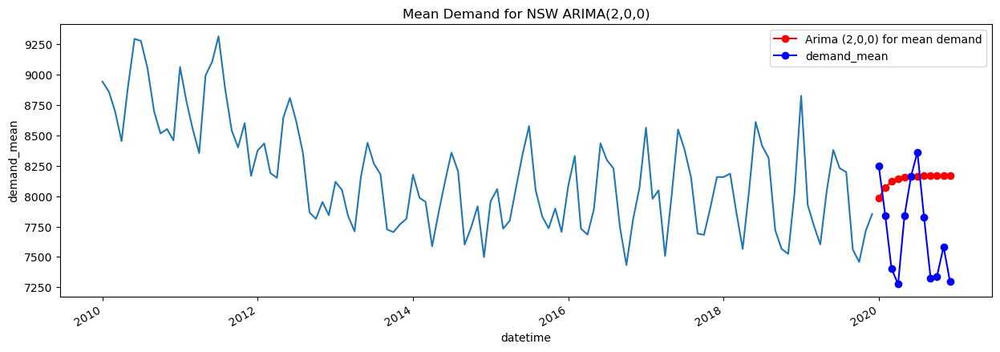

In [300]:
#Plotting predictions for mean demand

fig, ax = plt.subplots(figsize=(15,5))
chart = sns.lineplot(x='datetime', y="demand_mean", data=NSW)
chart.set_title('Mean Demand for NSW ARIMA(2,0,0)')
forecast.plot(ax=ax, color='red', marker="o", legend=True)
X_valid.plot(ax=ax, color='blue', marker="o", legend=True)

C:\Users\User\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\User\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Axes: title={'center': 'Peak Demand for NSW ARIMA(2,0,0)'}, xlabel='datetime', ylabel='demand_max'>

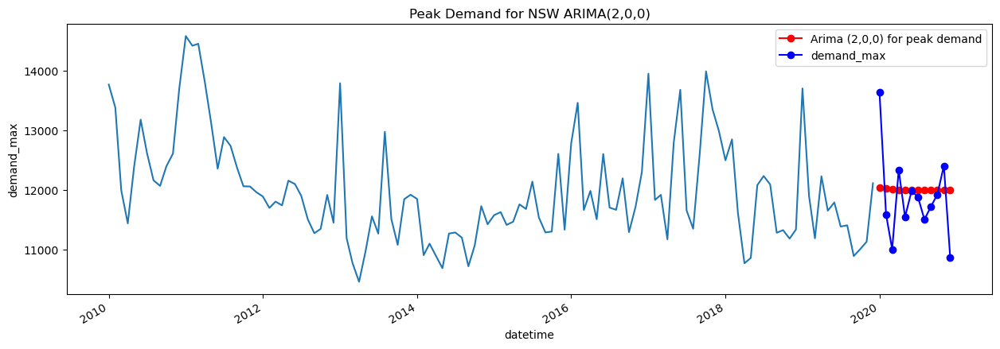

In [301]:
#Plotting predictions for peak demand

fig, ax = plt.subplots(figsize=(15,5))
chart = sns.lineplot(x='datetime', y="demand_max", data=NSW_peak)
chart.set_title('Peak Demand for NSW ARIMA(2,0,0)')
forecastpeak.plot(ax=ax, color='red', marker="o", legend=True)
Xpeak_valid.plot(ax=ax, color='blue', marker="o", legend=True)

In [302]:
print('The MSE of ARIMA(2,0,0) for Mean Demand is:', mean_squared_error(X_valid["demand_mean"].values, forecast.values, squared=False))

The MSE of ARIMA(2,0,0) for Mean Demand is: 586.0009767939473


C:\Users\User\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


In [303]:
print('The MSE of ARIMA(2,0,0) for Peak Demand is:', mean_squared_error(Xpeak_valid["demand_max"].values, forecastpeak.values, squared=False))

The MSE of ARIMA(2,0,0) for Peak Demand is: 697.220726366587


C:\Users\User\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


In [304]:
X_valid["demand_mean"].values


array([8250.83574211, 7837.17443966, 7405.22046371, 7276.30132639,
       7836.64643145, 8162.39989583, 8362.23353495, 7827.36259409,
       7326.90974965, 7340.2894086 , 7584.26811806, 7300.2584207 ])

In [305]:
Xpeak_valid["demand_max"].values

array([13634.63, 11588.33, 11001.07, 12334.04, 11544.22, 11980.08,
       11880.64, 11500.53, 11721.16, 11920.34, 12401.82, 10863.32])

In [306]:
forecast.values

array([7984.5474087 , 8071.2708446 , 8120.0987777 , 8145.09899609,
       8157.01928049, 8162.36116038, 8164.61247765, 8165.49802429,
       8165.81649824, 8165.91593997, 8165.93864419, 8165.93851241])

In [307]:
forecastpeak.values

array([12038.58758846, 12019.82241564, 12007.77836105, 12000.64346461,
       11996.39656809, 11993.86943404, 11992.36562493, 11991.47076171,
       11990.93826045, 11990.6213879 , 11990.43282833, 11990.32062324])

In [308]:
forecast

2020-01-01    7984.547409
2020-02-01    8071.270845
2020-03-01    8120.098778
2020-04-01    8145.098996
2020-05-01    8157.019280
2020-06-01    8162.361160
2020-07-01    8164.612478
2020-08-01    8165.498024
2020-09-01    8165.816498
2020-10-01    8165.915940
2020-11-01    8165.938644
2020-12-01    8165.938512
Freq: MS, Name: Arima (2,0,0) for mean demand, dtype: float64

In [309]:
forecastpeak

2020-01-01    12038.587588
2020-02-01    12019.822416
2020-03-01    12007.778361
2020-04-01    12000.643465
2020-05-01    11996.396568
2020-06-01    11993.869434
2020-07-01    11992.365625
2020-08-01    11991.470762
2020-09-01    11990.938260
2020-10-01    11990.621388
2020-11-01    11990.432828
2020-12-01    11990.320623
Freq: MS, Name: Arima (2,0,0) for peak demand, dtype: float64

### To find Best ARIMA for mean demand

In [310]:
import itertools
p=d=q=range(0,5)
pdq = list(itertools.product(p,d,q))
for param in pdq:
    try:
        mod_arima = ARIMA(X_train, order=param, freq="MS")
        mod_arima_fit = mod_arima.fit()
        print(param, mod_arima_fit.aic)
    except:
        continue

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


(0, 0, 0) 1804.277359757416
(0, 0, 1) 1740.2859918295399
(0, 0, 2) 1717.7036075076105
(0, 0, 3) 1715.3711179006


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self.

(0, 0, 4) 1717.3710952005454
(0, 1, 0) 1717.6357269408177
(0, 1, 1) 1719.53208784315
(0, 1, 2) 1692.2485082469482
(0, 1, 3) 1686.3290829496577


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
 

(0, 1, 4) 1685.9493599147668
(0, 2, 0) 1782.4857659547777
(0, 2, 1) 1715.4502360843046
(0, 2, 2) 1716.3171010242759
(0, 2, 3) 1688.1498310109953


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided,

(0, 2, 4) 1679.8030470537199
(0, 3, 0) 1885.055982970901
(0, 3, 1) 1778.3510147974741
(0, 3, 2) 1719.854455477476
(0, 3, 3) 1720.1637731923133
(0, 3, 4) 1692.4579213363015
(0, 4, 0) 2005.5349677227114
(0, 4, 1) 1875.4975582414381


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred freque

(0, 4, 2) 1775.2888290935487
(0, 4, 3) 1717.2830095587892


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


(0, 4, 4) 1717.841136849901
(1, 0, 0) 1719.4788241578945
(1, 0, 1) 1716.8253688396767
(1, 0, 2) 1710.014216550351


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


(1, 0, 3) 1705.1587185557232
(1, 0, 4) 1704.4446159868573
(1, 1, 0) 1719.57868993399


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters

(1, 1, 1) 1720.739980973545
(1, 1, 2) 1691.502302172446
(1, 1, 3) 1688.0246953837611


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was 

(1, 1, 4) 1673.1882623259667
(1, 2, 0) 1770.1787819545316
(1, 2, 1) 1716.7548959340263
(1, 2, 2) 1717.8580470356612


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


(1, 2, 3) 1719.0087854385088


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using 

(1, 2, 4) 1681.6218860034783
(1, 3, 0) 1835.395185860174
(1, 3, 1) 1768.5543793778156
(1, 3, 2) 1720.808615011986
(1, 3, 3) 1723.1586120784484
(1, 3, 4) 1690.349753850161
(1, 4, 0) 1914.5474556328265


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


(1, 4, 1) 1824.3509445534505
(1, 4, 2) 1764.574784894896


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


(1, 4, 3) 1773.378117444475
(1, 4, 4) 1721.2909236967037
(2, 0, 0) 1716.7440422176805
(2, 0, 1) 1718.491198274979


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred freque

(2, 0, 2) 1709.6876262055682
(2, 0, 3) 1706.9382475981404


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS wi

(2, 0, 4) 1707.5160948167445
(2, 1, 0) 1713.4217415276275
(2, 1, 1) 1680.868592139773
(2, 1, 2) 1676.3993473486216


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


(2, 1, 3) 1648.1628420773968


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible sta

(2, 1, 4) 1655.958684899661
(2, 2, 0) 1767.748816530895
(2, 2, 1) 1710.8761363183155
(2, 2, 2) 1719.7185057431875


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


(2, 2, 3) 1716.3121707127634


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using 

(2, 2, 4) 1664.2401711109762
(2, 3, 0) 1826.224816416644
(2, 3, 1) 1766.5463211775175
(2, 3, 2) 10.0


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


(2, 3, 3) 1771.91364979603


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using 

(2, 3, 4) 1695.3172972327873
(2, 4, 0) 1885.3615325138633
(2, 4, 1) 1816.1067685842572


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA paramete

(2, 4, 2) 1762.176191597431
(2, 4, 3) 1768.6909520958668


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as sta

(2, 4, 4) 1772.9972591186752
(3, 0, 0) 1717.6652302452594
(3, 0, 1) 1720.706289214922


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


(3, 0, 2) 1692.5968623533722


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


(3, 0, 3) 1665.4379554599877


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


(3, 0, 4) 1669.398908661812
(3, 1, 0) 1688.6392696041473
(3, 1, 1) 1672.3964335732203
(3, 1, 2) 1674.3558230178298


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


(3, 1, 3) 1651.5982616919732
(3, 1, 4) 1655.002346576667
(3, 2, 0) 1750.9106813462704


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


(3, 2, 1) 1686.9087069182601
(3, 2, 2) 1667.925227830689


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided,

(3, 2, 3) 1670.3906237257747


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using 

(3, 2, 4) 1666.3297896032695
(3, 3, 0) 1817.235486778637
(3, 3, 1) 1750.2227645279524
(3, 3, 2) 1691.5436844037972


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


(3, 3, 3) 1771.3441138261564


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided,

(3, 3, 4) 1726.2020994358904
(3, 4, 0) 1874.8838896817658
(3, 4, 1) 1807.9538256586268


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


(3, 4, 2) 1745.9372320319749


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


(3, 4, 3) 1867.9666389711497


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


(3, 4, 4) 1769.4691937385192
(4, 0, 0) 1702.648631046462
(4, 0, 1) 1688.771313383839


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWa

(4, 0, 2) 1674.5057247330465


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


(4, 0, 3) 1666.2659582813158


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


(4, 0, 4) 1668.4162950092343
(4, 1, 0) 1674.5937673941978
(4, 1, 1) 1674.2137777305459
(4, 1, 2) 1675.2529359744497


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


(4, 1, 3) 1657.2247688070952


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as sta

(4, 1, 4) 1652.8443369318106
(4, 2, 0) 1723.591142687496
(4, 2, 1) 1673.3276978373262
(4, 2, 2) 1672.8999110339655


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


(4, 2, 3) 1677.8240066735607


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as sta

(4, 2, 4) 1662.37457364773
(4, 3, 0) 1794.3761340095891
(4, 3, 1) 1723.8738001064469
(4, 3, 2) 1753.7884537651862


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA paramete

(4, 3, 3) 1696.1066363884527


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using 

(4, 3, 4) 1695.6172167069267
(4, 4, 0) 1855.6362252519632
(4, 4, 1) 1786.0333710237521


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


(4, 4, 2) 1722.8260031001205


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


(4, 4, 3) 1701.3449975539381
(4, 4, 4) 1761.6167110745118


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


### To find Best ARIMA for peak demand

In [311]:
import itertools
p=d=q=range(0,5)
pdq = list(itertools.product(p,d,q))
for param in pdq:
    try:
        mod_arima_peak = ARIMA(Xpeak_train, order=param, freq="MS")
        mod_arima_peak_fit = mod_arima_peak.fit()
        print(param, mod_arima_peak_fit.aic)
    except:
        continue

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


(0, 0, 0) 1974.5882686575756
(0, 0, 1) 1941.6654253469505
(0, 0, 2) 1934.7689080144257
(0, 0, 3) 1936.5059379175682
(0, 0, 4) 1938.1117613766721
(0, 1, 0) 1938.4048200496627
(0, 1, 1) 1924.8020334873888
(0, 1, 2) 1913.3964890436707
(0, 1, 3) 1915.1046607753474


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self.

(0, 1, 4) 1915.413011998117
(0, 2, 0) 2028.9987708795002
(0, 2, 1) 1950.7490703549445
(0, 2, 2) 1952.7213489163269


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred freque

(0, 2, 3) 1937.6697239307532
(0, 2, 4) 1938.4287703461566
(0, 3, 0) 2143.3020383503563
(0, 3, 1) 2020.6230004349177


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zer

(0, 3, 2) 1942.8666872526037
(0, 3, 3) 1941.7245041086271


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


(0, 3, 4) 1936.2708403606855
(0, 4, 0) 2266.1684331546826
(0, 4, 1) 2130.5987293459325
(0, 4, 2) 2014.212779357341
(0, 4, 3) 1988.8774378991006


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred freque

(0, 4, 4) 1940.331537596089
(1, 0, 0) 1930.7258145809265
(1, 0, 1) 1932.6252456916393
(1, 0, 2) 1930.5083767295814
(1, 0, 3) 1931.7829251917174
(1, 0, 4) 1932.6067388539948
(1, 1, 0) 1934.3874306932596
(1, 1, 1) 1914.7517096788497
(1, 1, 2) 1915.0657470485248
(1, 1, 3) 1916.9166561333968


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred freque

(1, 1, 4) 1917.5682483564299
(1, 2, 0) 2006.6827456423666
(1, 2, 1) 1952.7354141613982
(1, 2, 2) 1952.3925713611948


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred freque

(1, 2, 3) 1939.8911637886579
(1, 2, 4) 1941.1192726974632


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


(1, 3, 0) 2085.771857982317
(1, 3, 1) 1991.5884700359313
(1, 3, 2) 1941.90941180008


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zer

(1, 3, 3) 1945.1103386618286
(1, 3, 4) 1944.0304222077818


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


(1, 4, 0) 2170.3470948689715
(1, 4, 1) 2061.199608895557
(1, 4, 2) 1985.1032651018982


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


(1, 4, 3) 1940.5396733106272
(1, 4, 4) 1943.0372786913636


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


(2, 0, 0) 1932.6551571342188
(2, 0, 1) 1934.7302431547018
(2, 0, 2) 1932.1588380027001
(2, 0, 3) 1933.574464867678


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency

(2, 0, 4) 1934.016099549478
(2, 1, 0) 1926.3686509031775
(2, 1, 1) 1914.2842641133789
(2, 1, 2) 1916.7948859193748


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred freque

(2, 1, 3) 1918.3942692455394
(2, 1, 4) 1914.6578725349973
(2, 2, 0) 1994.6055057669764


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


(2, 2, 1) 1945.4593092370942
(2, 2, 2) 1953.2445897133553


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


(2, 2, 3) 1953.958270016613
(2, 2, 4) 1942.5066752080388
(2, 3, 0) 2058.269460408382


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


(2, 3, 1) 1982.4920414177616
(2, 3, 2) 1991.1163674048598


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


(2, 3, 3) 1945.4533962947326


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS wi

(2, 3, 4) 1949.4726501949522
(2, 4, 0) 2128.76204417022
(2, 4, 1) 2043.9340774801556
(2, 4, 2) 2055.9183238929636
(2, 4, 3) 1987.67676621902


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA paramete

(2, 4, 4) 1978.3245655787982
(3, 0, 0) 1933.7916927918186
(3, 0, 1) 1931.6728633040213
(3, 0, 2) 1933.1622528687412
(3, 0, 3) 1935.0427457651003


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


(3, 0, 4) 1931.4847956463404
(3, 1, 0) 1917.0205044392474
(3, 1, 1) 1915.5206681641591


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS wi

(3, 1, 2) 1917.805277834599
(3, 1, 3) 1919.5195010161672
(3, 1, 4) 1916.1555293903434
(3, 2, 0) 1977.4427042446573
(3, 2, 1) 1936.7560906642718


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS wi

(3, 2, 2) 1949.3828983444143
(3, 2, 3) 1939.7188395346614


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


(3, 2, 4) 1941.6068312763825
(3, 3, 0) 2035.4334717302875
(3, 3, 1) 1967.3164785012987


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


(3, 3, 2) 1986.3662295017505


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA paramete

(3, 3, 3) 1951.484368190713


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as sta

(3, 3, 4) 1952.0045453768284
(3, 4, 0) 2108.002593269315
(3, 4, 1) 2025.1843271455593
(3, 4, 2) 2047.6996950923663


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA paramete

(3, 4, 3) 1983.3387610274697


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


(3, 4, 4) 1995.0028685980426
(4, 0, 0) 1931.8227780027619
(4, 0, 1) 1932.4800841542512
(4, 0, 2) 1934.4739902992328


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWa

(4, 0, 3) 1933.127505533545


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


(4, 0, 4) 1932.8189277003407
(4, 1, 0) 1916.4324107183363
(4, 1, 1) 1914.4357778392966
(4, 1, 2) 1916.9500377764098


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


(4, 1, 3) 1916.0486534410124
(4, 1, 4) 1920.801217291124


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


(4, 2, 0) 1960.655058451094
(4, 2, 1) 1936.6507997602127


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likeli

(4, 2, 2) 1934.2516114070693


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


(4, 2, 3) 1936.2655110784096


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided,

(4, 2, 4) 1937.5196833872576
(4, 3, 0) 1999.4531561179742
(4, 3, 1) 1952.0883648477036


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


(4, 3, 2) 1934.0874112177603


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


(4, 3, 3) 1938.440566296662


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


(4, 3, 4) 1939.1304575477013
(4, 4, 0) 2059.905835475579
(4, 4, 1) 1990.46057531324


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


(4, 4, 2) 1947.0460975232868


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


(4, 4, 3) 1956.8448364599733
(4, 4, 4) 1950.3092684186652


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


## ARIMA for mean demand using best model (2,1,3)

In [312]:

mod_arima = ARIMA(X_train, order=(2,1,3))#tarting 2-1-3 finding the best
mod_arima_fit = mod_arima.fit()
print(mod_arima_fit.summary())

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


                               SARIMAX Results                                
Dep. Variable:            demand_mean   No. Observations:                  120
Model:                 ARIMA(2, 1, 3)   Log Likelihood                -818.081
Date:                Thu, 11 Apr 2024   AIC                           1648.163
Time:                        22:17:59   BIC                           1664.838
Sample:                    01-01-2010   HQIC                          1654.934
                         - 12-01-2019                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9978      0.012     86.538      0.000       0.975       1.020
ar.L2         -0.9987      0.004   -257.316      0.000      -1.006      -0.991
ma.L1         -1.4662      0.105    -13.929      0.0

## ARIMA for peak demand using best model (2,1,1)

In [313]:
mod_arima_peak = ARIMA(Xpeak_train, order=(2,1,1))#tarting 0-1-2 finding the best
mod_arima_peak_fit = mod_arima_peak.fit()
print(mod_arima_peak_fit.summary())

                               SARIMAX Results                                
Dep. Variable:             demand_max   No. Observations:                  120
Model:                 ARIMA(2, 1, 1)   Log Likelihood                -953.142
Date:                Thu, 11 Apr 2024   AIC                           1914.284
Time:                        22:17:59   BIC                           1925.401
Sample:                    01-01-2010   HQIC                          1918.798
                         - 12-01-2019                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.3372      0.118      2.847      0.004       0.105       0.569
ar.L2         -0.1517      0.107     -1.415      0.157      -0.362       0.058
ma.L1         -0.7565      0.116     -6.519      0.0

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


In [314]:
#ARIMA Predictions(2,1,3) for mean demand
forecast = mod_arima_fit.forecast(12)

#passing the index
forecast = pd.Series(forecast)
forecast = forecast.rename("Arima (2,1,3) for mean demand")


In [315]:
#ARIMA Predictions(0,1,2) for mean demand
forecastpeak = mod_arima_peak_fit.forecast(12)

#passing the index
forecastpeak = pd.Series(forecastpeak)
forecastpeak = forecastpeak.rename("Arima (0,1,2) for peak demand")

C:\Users\User\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\User\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Axes: title={'center': 'Mean Demand for NSW ARIMA(2,1,3)'}, xlabel='datetime', ylabel='demand_mean'>

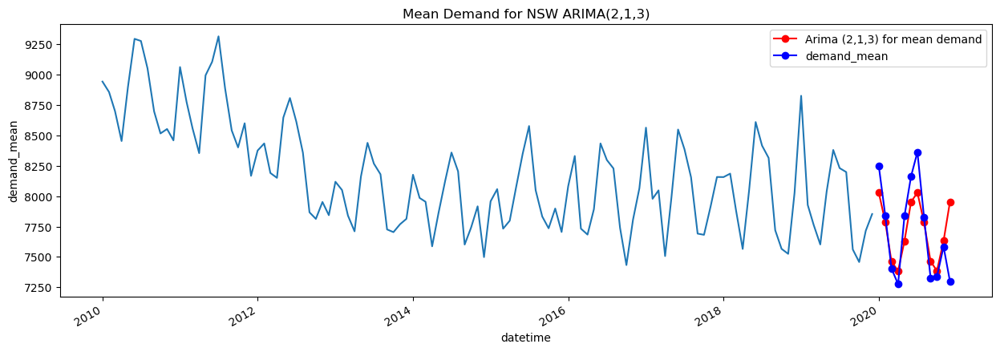

In [316]:
#Plotting predictions for mean demand ARIMA (2,1,3)

fig, ax = plt.subplots(figsize=(15,5))
chart = sns.lineplot(x='datetime', y="demand_mean", data=NSW)
chart.set_title('Mean Demand for NSW ARIMA(2,1,3)')
forecast.plot(ax=ax, color='red', marker="o", legend=True)
X_valid.plot(ax=ax, color='blue', marker="o", legend=True)

C:\Users\User\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\User\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Axes: title={'center': 'Peak Demand for NSW ARIMA(0,1,2)'}, xlabel='datetime', ylabel='demand_max'>

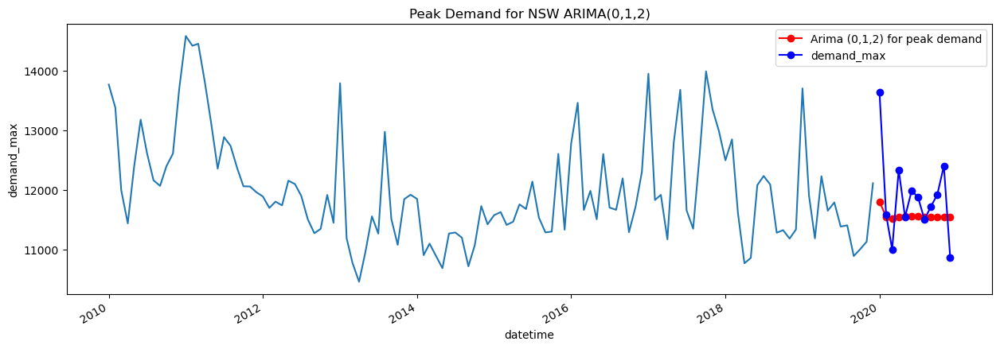

In [317]:
#Plotting predictions for peak demand ARIMA (0,1,2)

fig, ax = plt.subplots(figsize=(15,5))
chart = sns.lineplot(x='datetime', y="demand_max", data=NSW_peak)
chart.set_title('Peak Demand for NSW ARIMA(0,1,2)')
forecastpeak.plot(ax=ax, color='red', marker="o", legend=True)
Xpeak_valid.plot(ax=ax, color='blue', marker="o", legend=True)

In [319]:
print('The MSE of ARIMA(2,1,3) for mean demand is:', mean_squared_error(X_valid["demand_mean"].values, forecast.values, squared=False))

NameError: name 'root_mean_squared_error' is not defined

In [126]:
print('The MSE of ARIMA(0,1,2) for peak demand is:', mean_squared_error(Xpeak_valid["demand_max"].values, forecastpeak.values, squared=False))

The MSE of ARIMA(0,1,2) for peak demand is: 702.2934278405924


C:\Users\User\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


In [127]:
#ARIMA(2,1,3) Predictions for mean demand 
forecast = mod_arima_fit.forecast(24)

#passing the index
forecast = pd.Series(forecast)
forecast = forecast.rename("Arima")

In [128]:
forecast

2020-01-01    8030.811813
2020-02-01    7785.959626
2020-03-01    7462.790332
2020-04-01    7384.847277
2020-05-01    7629.816642
2020-06-01    7952.099179
2020-07-01    8029.040363
2020-08-01    7783.956874
2020-09-01    7462.561014
2020-10-01    7386.618573
2020-11-01    7631.813140
2020-12-01    7952.322411
2021-01-01    8027.269239
2021-02-01    7781.966626
2021-03-01    7462.343847
2021-04-01    7388.389507
2021-05-01    7633.797143
2021-06-01    7952.533535
2021-07-01    8025.498513
2021-08-01    7779.988866
2021-09-01    7462.138744
2021-10-01    7390.160006
2021-11-01    7635.768663
2021-12-01    7952.732638
Freq: MS, Name: Arima, dtype: float64

In [129]:
##Auto ARIMA for mean demand

auto_arima_mod = pm.auto_arima(X_train, seaasonal=False, m=12)

#Forecast
frecast_auto = auto_arima_mod.predict(12)
frecast_auto = pd.Series(frecast_auto)
frecast_auto = frecast_auto.rename("Auto-Arima for mean demand")

In [130]:
##Auto ARIMA for peak demand

auto_arima_mod_peak = pm.auto_arima(Xpeak_train, seaasonal=False, m=12)

#Forecast
frecast_auto_peak = auto_arima_mod_peak.predict(12)
frecast_auto_peak = pd.Series(frecast_auto_peak)
frecast_auto_peak = frecast_auto_peak.rename("Auto-Arima for peak demand")

C:\Users\User\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\User\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Axes: title={'center': 'Auto ARIMA for mean demand - NSW'}, xlabel='datetime', ylabel='demand_mean'>

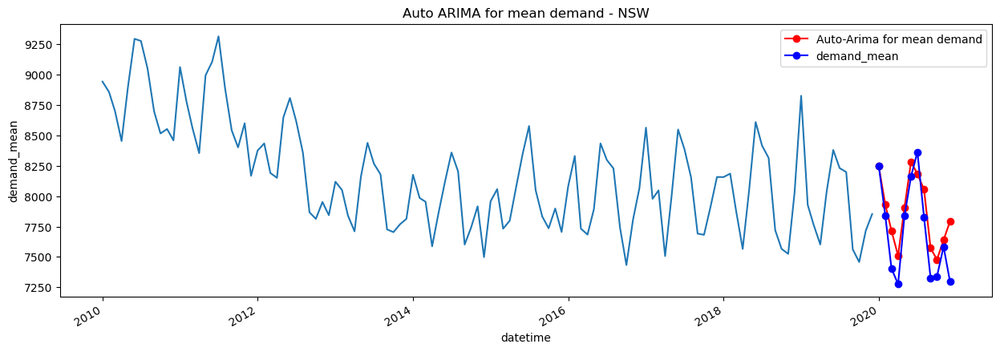

In [131]:
fig, ax = plt.subplots(figsize=(15,5))
chart = sns.lineplot(x='datetime', y="demand_mean", data=NSW)
chart.set_title('Auto ARIMA for mean demand - NSW')
frecast_auto.plot(ax=ax, color='red', marker="o", legend=True)
X_valid.plot(ax=ax, color='blue', marker="o", legend=True)

C:\Users\User\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\User\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Axes: title={'center': 'Auto ARIMA for peak demand - NSW'}, xlabel='datetime', ylabel='demand_max'>

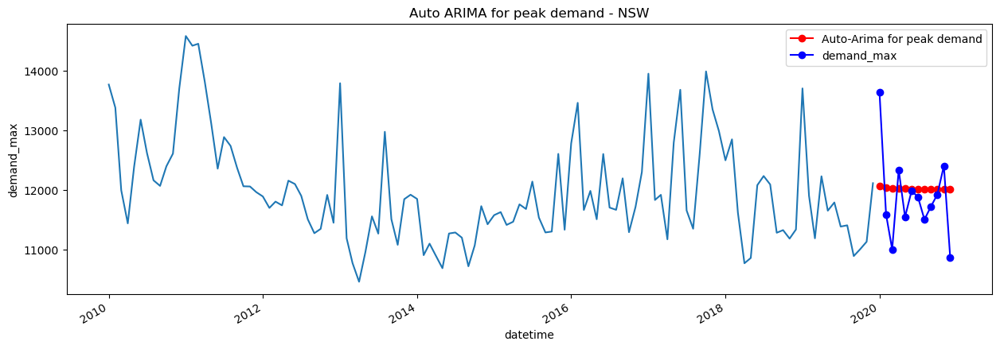

In [132]:
fig, ax = plt.subplots(figsize=(15,5))
chart = sns.lineplot(x='datetime', y="demand_max", data=NSW_peak)
chart.set_title('Auto ARIMA for peak demand - NSW')
frecast_auto_peak.plot(ax=ax, color='red', marker="o", legend=True)
Xpeak_valid.plot(ax=ax, color='blue', marker="o", legend=True)

In [133]:
print('The MSE of Auto-ARIMA for mean demand is:', mean_squared_error(X_valid["demand_mean"].values, frecast_auto.values, squared=False))

The MSE of Auto-ARIMA for mean demand is: 221.06842812013923


C:\Users\User\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


In [134]:
print('The MSE of Auto-ARIMA for peak demand is:', mean_squared_error(Xpeak_valid["demand_max"].values, frecast_auto_peak.values, squared=False))

The MSE of Auto-ARIMA for peak demand is: 700.3967952576963


C:\Users\User\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


In [135]:
frecast_auto

2020-01-01    8245.347327
2020-02-01    7929.835384
2020-03-01    7715.324733
2020-04-01    7511.026356
2020-05-01    7903.081476
2020-06-01    8281.746921
2020-07-01    8181.500497
2020-08-01    8054.724887
2020-09-01    7572.488302
2020-10-01    7478.125861
2020-11-01    7638.264191
2020-12-01    7791.521760
Freq: MS, Name: Auto-Arima for mean demand, dtype: float64

In [136]:
frecast_auto_peak

2020-01-01    12066.783406
2020-02-01    12042.402168
2020-03-01    12028.788906
2020-04-01    12021.187942
2020-05-01    12016.943945
2020-06-01    12014.574309
2020-07-01    12013.251223
2020-08-01    12012.512479
2020-09-01    12012.100000
2020-10-01    12011.869693
2020-11-01    12011.741101
2020-12-01    12011.669302
Freq: MS, Name: Auto-Arima for peak demand, dtype: float64

## FBProphet for peak demand

In [178]:
demand_max.columns = ['y', 'ds']
demand_max.tail()



,y,ds
127,11500.53,2020-08-01
128,11721.16,2020-09-01
129,11920.34,2020-10-01
130,12401.82,2020-11-01
131,10863.32,2020-12-01


In [179]:
train = demand_max.iloc[:len(demand_max)-12]
test = demand_max.iloc[len(demand_max)-12:]

In [180]:
train

,y,ds
0,13765.04,2010-01-01
1,13377.27,2010-02-01
2,11991.47,2010-03-01
3,11436.13,2010-04-01
4,12386.49,2010-05-01
...,...,...
115,11403.56,2019-08-01
116,10887.57,2019-09-01
117,11001.19,2019-10-01
118,11128.43,2019-11-01


In [181]:
test

,y,ds
120,13634.63,2020-01-01
121,11588.33,2020-02-01
122,11001.07,2020-03-01
123,12334.04,2020-04-01
124,11544.22,2020-05-01
125,11980.08,2020-06-01
126,11880.64,2020-07-01
127,11500.53,2020-08-01
128,11721.16,2020-09-01
129,11920.34,2020-10-01


In [137]:
# from fbprophet import Prophet
# m = Prophet()
# m.fit(train) 
# future = m.make_future_dataframe(periods=12)#MS for monthly, H for hourly
# forecastFB = m.predict(future)

In [ ]:
#forecastFB.tail()

In [ ]:
#forecastFB[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

In [ ]:
#test.tail()

In [ ]:
#plot_plotly(m, forecastFB)

In [ ]:
#plot_components_plotly(m, forecastFB)

## Evaluating FBProphet

In [183]:
from statsmodels.tools.eval_measures import rmse
#predictions = forecastFB.iloc[-12:]['yhat']

In [185]:
#print("Root Mean Squared Error between actual and predicted values: ", rmse(predictions, test['y']))
#print("Mean Value of test Dataset:", test['y'].mean())

# Linear Regression

In [138]:
demand_excl_2021.head()

,Unnamed: 0,Year,Month,temp_mean,temp_min,temp_max,demand_mean,demand_sum,demand_max,demand_mean_max,Cumulative,Population,GSP,datetime
0,0,2010,1,20.868008,1.6,41.1,8941.450389,13108166.27,13765.04,10613.530000,28278.392,7110454,44504.25,2010-01-01
1,1,2010,2,20.218907,3.2,35.4,8855.467677,11662650.93,13377.27,10380.667857,32153.986,7119405,44504.25,2010-02-01
2,2,2010,3,19.828286,6.3,34.7,8698.725127,12639247.61,11991.47,10132.978710,38195.588,7128356,44504.25,2010-03-01
3,3,2010,4,17.593856,6.5,29.9,8452.863411,11969254.59,11436.13,9804.072333,45142.723,7133668,44504.25,2010-04-01
4,4,2010,5,15.323485,3.1,28.4,8897.770510,12919562.78,12386.49,10558.023548,54370.332,7138980,44504.25,2010-05-01


In [139]:
demand_excl_2021.to_csv('C:/Users/User/Documents/UNSW_Data Science 7446/ZZSC9020 Data Science Capstone Project/Data/dem_excl_2021.csv',index=False)

In [140]:
x = demand_excl_2021.drop(['Year', 'Month', 'demand_max', 'datetime'], axis=1).values
y = demand_excl_2021['demand_max'].values

## Defining x and y

In [141]:
print(x)

[[0.00000000e+00 2.08680082e+01 1.60000000e+00 ... 2.82783920e+04
  7.11045400e+06 4.45042500e+04]
 [1.00000000e+00 2.02189066e+01 3.20000000e+00 ... 3.21539860e+04
  7.11940500e+06 4.45042500e+04]
 [2.00000000e+00 1.98282863e+01 6.30000000e+00 ... 3.81955880e+04
  7.12835600e+06 4.45042500e+04]
 ...
 [1.29000000e+02 1.75980511e+01 7.00000000e+00 ... 3.13738812e+06
  8.09737000e+06 5.61096667e+04]
 [1.30000000e+02 2.01848611e+01 6.50000000e+00 ... 3.23484487e+06
  8.09583500e+06 5.61096667e+04]
 [1.31000000e+02 1.94038306e+01 5.20000000e+00 ... 3.34042050e+06
  8.09430000e+06 5.61096667e+04]]


In [142]:
print(y)

[13765.04 13377.27 11991.47 11436.13 12386.49 13176.33 12616.29 12158.8
 12065.1  12394.02 12606.64 13700.02 14579.86 14417.03 14449.88 13810.3
 13121.52 12354.12 12883.81 12736.43 12367.92 12058.56 12055.05 11960.01
 11887.6  11695.39 11801.08 11738.11 12152.87 12096.07 11897.55 11504.56
 11270.91 11344.03 11913.49 11446.72 13787.85 11186.   10769.45 10456.64
 10956.21 11553.75 11264.18 12972.78 11506.23 11075.95 11841.88 11916.82
 11845.77 10902.47 11095.83 10885.23 10683.85 11265.85 11282.96 11196.49
 10715.74 11066.85 11724.94 11421.16 11574.02 11625.47 11410.1  11463.39
 11755.17 11677.38 12137.29 11533.73 11283.72 11298.69 12601.82 11329.6
 12777.07 13458.63 11660.81 11980.94 11505.27 12599.78 11701.21 11663.09
 12191.08 11287.87 11713.57 12297.62 13947.7  11828.37 11914.9  11168.62
 12790.82 13677.86 11652.8  11345.96 12601.15 13985.87 13348.37 12986.04
 12494.58 12846.15 11615.92 10766.64 10855.27 12076.7  12230.57 12088.8
 11278.72 11322.89 11180.67 11333.28 13700.9  11898.99 

## Splitting dataset into training  and test set

In [161]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.4, random_state=0)

In [162]:
from sklearn.linear_model import LinearRegression
regr = LinearRegression()

regr.fit(x_train, y_train)

LinearRegression()

In [152]:
print(regr.score(x_test, y_test))

0.5265570741176274


In [163]:
datafile = 'C:/Users/User/Documents/UNSW_Data Science 7446/ZZSC9020 Data Science Capstone Project/Data/dem_excl_2021.csv'

In [153]:
y_pred = regr.predict(x_test)

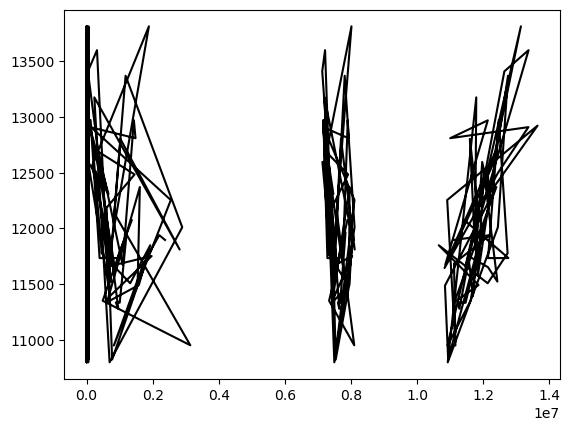

In [156]:
plt.plot(x_test, y_pred, color ='k')
plt.show()

In [157]:
r2 = r2_score(y_test, y_pred)

In [158]:
print("R2 score:", r2)

R2 score: 0.5265570741176274


In [165]:
def get_data(datafile, normalise, i): 

    data_in = genfromtxt(datafile, delimiter=",") # in case of csv data
 

    #data_inputx = data_in[:,0:8] # all features 0, - 7
    #data_inputx = data_in[:,[1]]  # one feature
    data_inputx = data_in[:,[2,3,4,5,6,8,9,10,11]]  # two features   

    if normalise == True:
        transformer = Normalizer().fit(data_inputx)  # fit does nothing.
        data_inputx = transformer.transform(data_inputx)
 


    data_inputy = data_in[:,7] # this is target - so that last col is selected from data

    percent_test = 0.4
    '''testsize = int(percent_test * data_inputx.shape[0]) 
    x_train = data_inputx[:-testsize]
    x_test = data_inputx[-testsize:] 
    y_train = data_inputy[:-testsize]
    y_test = data_inputy[-testsize:]'''


    #another way you can use scikit-learn train test split with random state
    x_train, x_test, y_train, y_test = train_test_split(data_inputx, data_inputy, test_size=percent_test, random_state=i)

    return x_train, x_test, y_train, y_test

(132, 14)